<a href="https://colab.research.google.com/github/sebabecerra/ComputerVision/blob/main/Tarea_CV2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introducción a la Visión Computacional
## Tarea 2
# **`Reconocimiento Facial en Obras de Arte`**
-----------------------
<div align="right">
Sebastian Becerra
</div>
<div align="right">
Fecha: 5 de mayo de 2022.
</div>

1. Diseñar un flujo de procesamiento a nivel abstracto: adquisición de imágenes, pre-procesamiento, procesamiento de imágenes, cálculo de la medición, almacenamiento.

## Rta:
Para este proyecto de vision computacional intentare hacer reconocimiento facial sobre las principales obras de arte. En este sentido intentare detectar rostros en los cuadros presentes en el siguiente [dataset](https://www.kaggle.com/datasets/ansonnnnn/historic-art).

En el primer paso se intenta detectar al menos una cara presente en cualquier cuadro. De forma similar a como hacemos los humanos, para que un sistema informático sea capaz de identificar a las personas que aparecen en una imagen, son necesarias varias etapas:

1. #### Detectar las caras en la imagen.
Para esto utilizare una red euronal capaz de mapear las características de una cara humana en una representación numérica. Este paso se conoce como embedding o encoding.

2. #### Medir la similitud entre la representación numérica de las caras detectadas y las representaciones de referencia disponibles en la base de datos.

3. #### Determinar si son suficientemente similares para considerar que pertenecen a la misma persona y asignarle la identidad.

A lo largo de este documento, se describen e implementan cada uno de los pasos haciendo uso de las librerías disponibles en python. 

# Flujo Teorico General
-----------------------
![picture](https://drive.google.com/uc?export=view&id=14wcp-AVz3EYqZNZiqZfT9uK0VCkX7MoX)



#D-ART: Deteccion de obras de Arte.
-----------------------
![picture](https://drive.google.com/uc?export=view&id=1jCiRolcIUn1qWYnIyZxwFiOIa5QAFJf5)

In [ ]:
!pip install facenet_pytorch
!pip install pillow

In [ ]:
import torch
from facenet_pytorch import MTCNN
import numpy as np
from PIL import Image, ImageFilter
from PIL.ImageFilter import (
   BLUR, CONTOUR, DETAIL, EDGE_ENHANCE, EDGE_ENHANCE_MORE,
   EMBOSS, FIND_EDGES, SMOOTH, SMOOTH_MORE, SHARPEN
)
import cv2
import matplotlib.pyplot as plt
import os
import numpy as np
import pandas as pd
import PIL
import time
import random
import shutil
import statistics

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
#Directorio donde estan guardadas las imagenes
input_dir = '/content/gdrive/MyDrive/complete'
path = input_dir + '/artwork'
files = os.listdir(path)
print(len(files))

45574


2. Con la base de datos seleccionada, implementar un sistema de reconocimiento y/o procesamiento en el cual se realice una medida o inferencia sobre imagen. Puede ser la detección de un objeto, medición de distancias entre píxeles de alguna característica, medición del tamaño de algún objeto (en cantidad de píxeles) clasificación de la imagen, entre otros.

3. Para procesar el conjunto completo de imágenes, medir los tiempos de ejecución del proceso completo. Realizar la medición para el 50% y el 100% de la imágenes varias veces, de manera de obtener algunas figuras estadísticas: tiempo máximo, tiempo mínimo, tiempo medio, desviación estándar del tiempo.

4. Hacer resumen de los resultados del procesamiento. Para ello debe decidir una métrica para indicar si el procesamiento es satisfactorio. Para esto último algunas veces es necesario hacer la evaluación en forma manual, por lo tanto, si fuera este el caso, seleccionar un sub-conjunto de las imágenes (por ejemplo, unas 50) y comparar el desempeño del algoritmo en estas imágenes.

5. Escribir un informe o entregar el notebook con comentarios y documentación, incluyendo el análisis (comentando) los resultados.

## Rta 2, 3 y 4:
1. A traves de un loop se crean 1 carpetas que contrendran a su vez 500 imagens al azar y a estas se procesaran se forma simple y se aplicaran los siguientes procedimeintos y se medira el tiempo:

    * Cargar la imagen.
    * Convertir a RGB.
    * Cambiar tamano. 
    * Aplicar filtros 
    * Conviertir a una cadena de color en una tupla RGB. Si la cadena no se puede analizar, esta función genera una excepción ValueError.)
    * Rotar las imagenes en 45, -45, 90 y -90 grados para hacer pruebas de robustez de los algoritmos de deteccion ce caras.
  

In [ ]:
files = os.listdir(path)
size = 400, 400
num = 1
for x in range(num):
  randomlist = random.sample(files, 500)
  shutil.rmtree(input_dir + "/" + str(x), ignore_errors=True)
  os.makedirs(input_dir + "/" + str(x), exist_ok=True)
  os.chdir(input_dir + "/" + str(x))
  tiempo_t = []
  images = []
  images_colors = []
  images_size = []
  images_sharpen = []
  images_blur = []
  images_blur_gauss = []
  images_flip = []
  images_details = []
  images_enhance = []
  images_enhance_more = []
  images_emboss = []
  images_find_edges = []
  images_smooth = []
  images_sharpen = []
  images_45 = []
  images_45_2 = []
  images_90 = []
  images_90_2 = []
  for f in randomlist:
    start = time.time()
    img = Image.open(path + '/' + f).convert('RGB')
    img = img.resize(size, Image.ANTIALIAS)
    img.save(str(f) +"-100.png", "PNG")
    color = img.getcolors() 
    size = img.size
    img_b = img.filter(ImageFilter.BoxBlur(15))
    img_bg = img.filter(ImageFilter.GaussianBlur(radius=5))
    img_f = img.transpose(Image.FLIP_LEFT_RIGHT)
    img_d = img.filter(DETAIL)
    img_en = img.filter(EDGE_ENHANCE)
    img_en_m = img.filter(EDGE_ENHANCE_MORE)
    img_emb = img.filter(EMBOSS)
    img_fe = img.filter(FIND_EDGES)
    img_sm = img.filter(SMOOTH)
    img_sh = img.filter(SHARPEN)
    img_45 = img.rotate(45)
    img_45_2 = img.rotate(-45)
    img_90 = img.rotate(90)
    img_90_2 = img.rotate(-90)
    images.append(img)
    images_colors.append(color)
    images_size.append(size)
    images_blur.append(img_b)
    images_blur_gauss.append(img_bg)
    images_flip.append(img_f)
    images_details.append(img_d)
    images_enhance.append(img_en)
    images_enhance_more.append(img_en_m)
    images_emboss.append(img_emb)
    images_find_edges.append(img_fe)
    images_smooth.append(img_sm)
    images_sharpen.append(img_sh)
    images_45.append(img_45)
    images_45_2.append(img_45_2)
    images_90.append(img_90)
    images_90_2.append(img_90_2)
    end = time.time()
    tiempo = end - start
    tiempo_t.append(tiempo)
    #print(end - start)

Se mide el tiempo de ejecucion para cada carpeta creada con 500 imagenes y tenemos las principales estadisticas del tiempo consumido.

Se puede apreciar un tiempo promedio de 0.6 segundos para procesar cada imagen, con una desviasion estandar de 0.17 segundos, un minimo de 0.14 segundos y un maximo de 1.8 segundos.

In [ ]:
tiempo=pd.DataFrame(tiempo_t)
tiempo.columns = ['segundos']
print("tiempo para procesar cada Imagen \n", tiempo.describe())

tiempo para procesar cada Imagen 
          segundos
count  500.000000
mean     0.611118
std      0.173125
min      0.136094
25%      0.594476
50%      0.627537
75%      0.659230
max      1.819690


## Rta 2, 3 y 4 Continuacion:
En esta parte del proyecto seleccionaremos selecciono 5 imagenes para chequear que las medidas aplicadas (cargar imagen, distintos filtros, rotacion) se aplicaron correctamente.

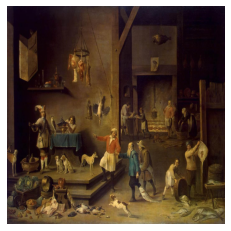

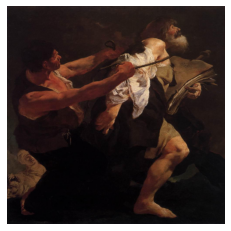

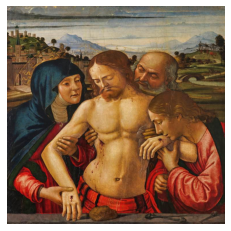

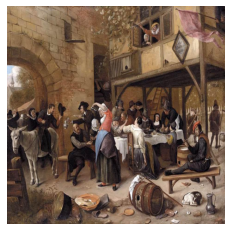

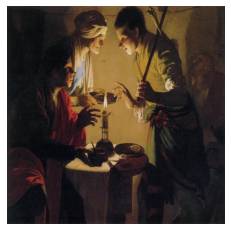

In [ ]:
#Graficar las Imagenes Centradas
for i in range(len(images[:5])):
  plt.figure(figsize=(5, 4))
  plt.imshow(images[i])
  plt.axis('off')

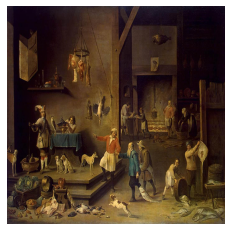

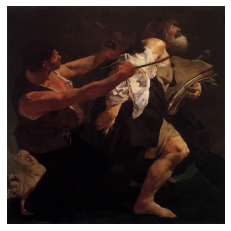

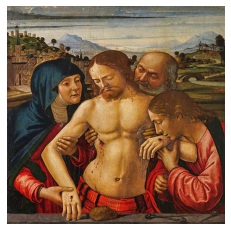

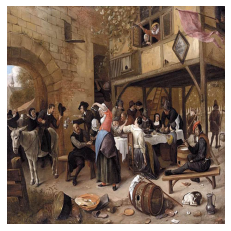

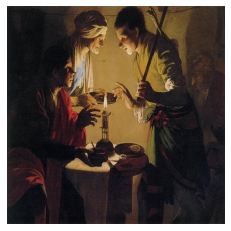

In [ ]:
#Graficar las Imagenes Centradas
for i in range(len(images_details[:5])):
  plt.figure(figsize=(5, 4))
  plt.imshow(images_details[i])
  plt.axis('off')

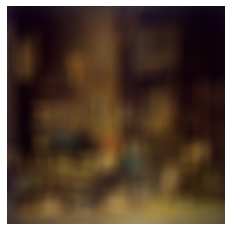

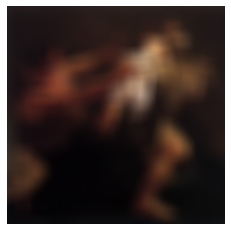

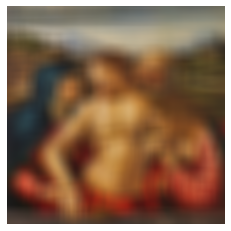

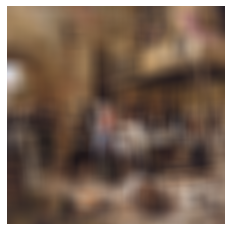

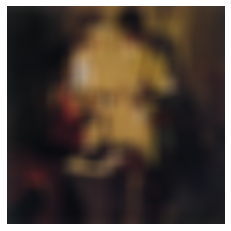

In [ ]:
#Graficar las Imagenes Centradas con filtro Blur
for i in range(len(images_blur[:5])):
  plt.figure(figsize=(5, 4))
  plt.imshow(images_blur[i])
  plt.axis('off')

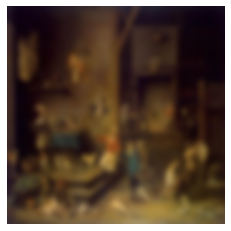

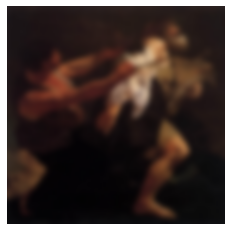

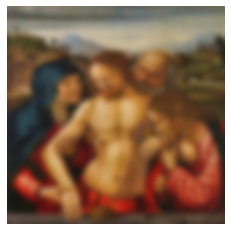

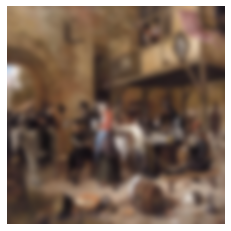

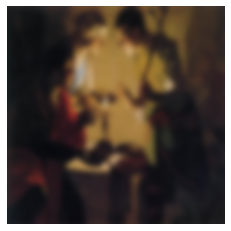

In [ ]:
#Graficar las Imagenes Centradas con filtro Blur Gaussiano
for i in range(len(images_blur_gauss[:5])):
  plt.figure(figsize=(5, 4))
  plt.imshow(images_blur_gauss[i])
  plt.axis('off')

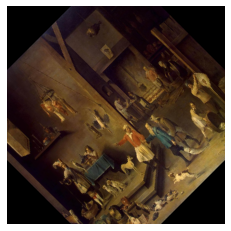

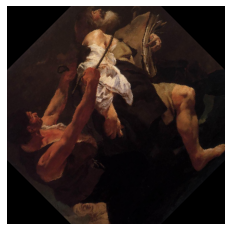

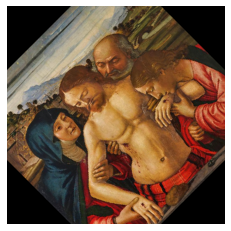

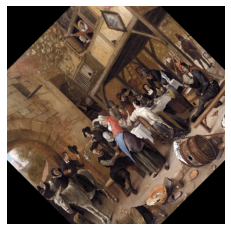

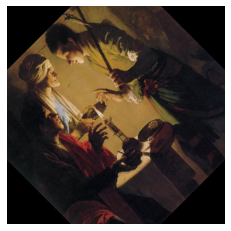

In [ ]:
#Graficar las Imagenes Rotadas 45
for i in range(len(images_45[:5])):
  plt.figure(figsize=(5, 4))
  plt.imshow(images_45[i])
  plt.axis('off')

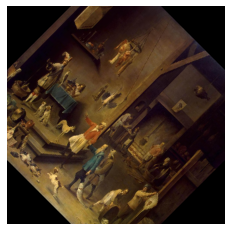

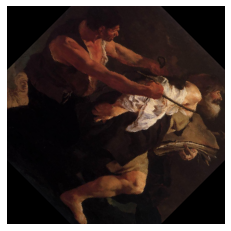

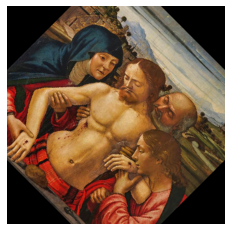

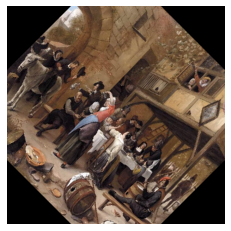

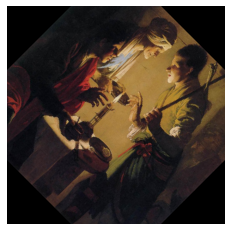

In [ ]:
#Graficar las Imagenes Rotadas -45
for i in range(len(images_45_2[:5])):
  plt.figure(figsize=(5, 4))
  plt.imshow(images_45_2[i])
  plt.axis('off')

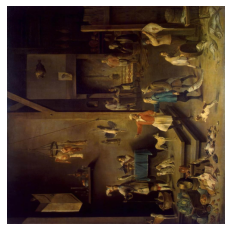

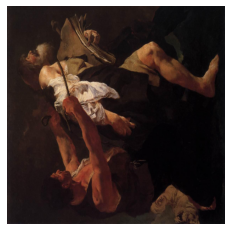

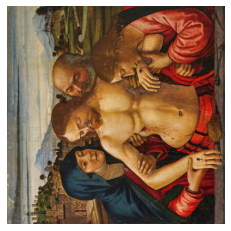

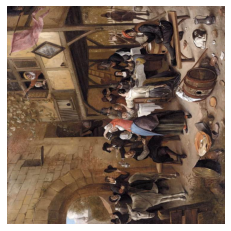

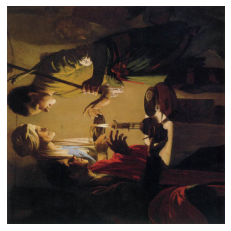

In [ ]:
#Graficar las Imagenes Rotadas 90
for i in range(len(images_90[:5])):
  plt.figure(figsize=(5, 4))
  plt.imshow(images_90[i])
  plt.axis('off')

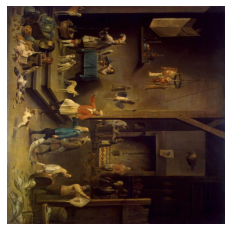

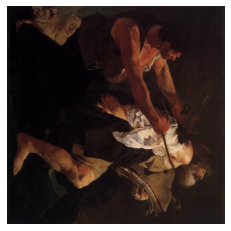

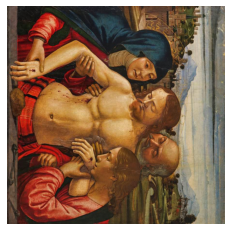

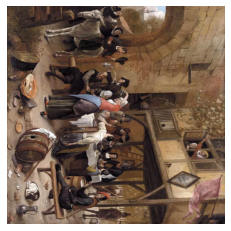

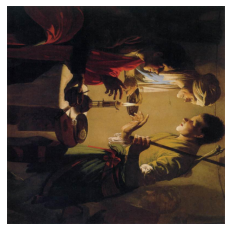

In [ ]:
#Graficar las Imagenes Rotadas -90
for i in range(len(images_90_2[:5])):
  plt.figure(figsize=(5, 4))
  plt.imshow(images_90_2[i])
  plt.axis('off')

## Rta 2, 3 y 4 Continuacion:

En parte de la tarea intentare detectar rostros en las obras de arte. Para esto 
aplicare el procedimiento a toda la base de datos y luego filtrare descartando
donde no se detecten rostros.

In [ ]:
 #Detectar si se dispone de GPU cuda
# ==============================================================================
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print('Running on device: {}'.format(device))
# Detector MTCNN
# ==============================================================================
mtcnn = MTCNN(
            select_largest = True,
            min_face_size  = 20,
            thresholds     = [0.6, 0.7, 0.7],
            post_process   = False,
            image_size     = 160,
            device         = device
        )

Running on device: cpu


In [ ]:
# num es igual al numero de muestras que se ejecutaron
num = 1
d = {}
for x in range(num):
  images=[]
  carpeta=x
  path='/content/gdrive/MyDrive/complete/' +str(carpeta)
  files = os.listdir(path)
  boxes = []
  probs = []
  landmarks = []
  tiempo_t2 = []
  for f in files: 
    start2 = time.time()
    img = Image.open(path + '/' + f)
    # algoritmo que detecta caras
    box, prob, landmark = mtcnn.detect(img, landmarks=True)
    end2 = time.time()
    tiempo2 = end2 - start2
    tiempo_t2.append(tiempo2)
    #print(tiempo_t2)
    images.append(img)
    boxes.append(box)
    probs.append(prob)
    landmarks.append(landmark)
#Elimina donde no encuentra caras el algoritmo
  i=pd.DataFrame(images)
  b=pd.DataFrame(boxes)
  p=pd.DataFrame(probs)
  l=pd.DataFrame(landmarks)
  df = pd.concat([b,l,i], axis=1)
  df = df.dropna()
  df.columns = ['box', 'landmark', 'imagen']
  d[x] = pd.DataFrame(df)
  

Se mide el tiempo de ejecucion para cada carpeta creada con 500 imagenes y tenemos las principales estadisticas del tiempo consumido para detectar una cara.

Se puede apreciar un tiempo promedio de 0.26 segundos para detectar una cara en cada imagen, con una desviasion estandar de 0.13 segundos, un minimo de 0.09 segundos y un maximo de 1 segundos.

In [ ]:
tiempo2=pd.DataFrame(tiempo_t2)
tiempo2.columns = ['segundos']
print("tiempo para detectar una cara en cada Imagen \n", tiempo2.describe())

tiempo para detectar una cara en cada Imagen 
          segundos
count  500.000000
mean     0.262637
std      0.134365
min      0.090392
25%      0.160072
50%      0.236116
75%      0.320017
max      1.027614


#Resultados
-----------------------
En general podemos observar que el algoritmo logra detectar de buena forma rostros en las imagenes de 40 imagenes analizadas observamos que detecta de forma correcta 28, es decir un 70%.

Como primera aproximacion observamos que solo detecta un rostro por imagen. Seleccionaron dos imagenes con multiples rostros para analizar si el algoritmo es capaz de identificar mas de una cara en la misma imagen.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]


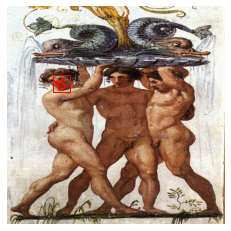

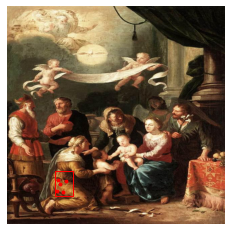

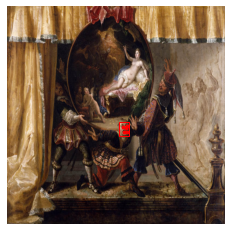

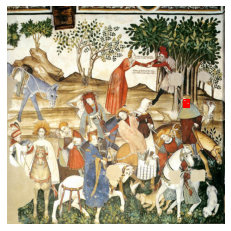

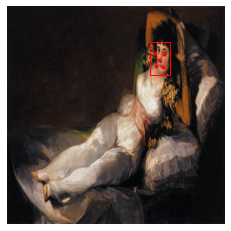

...

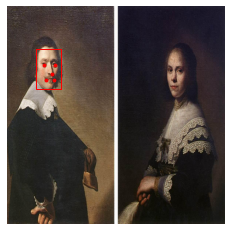

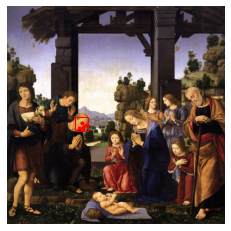

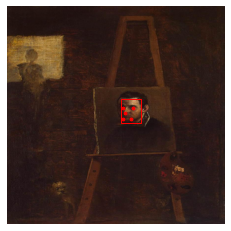

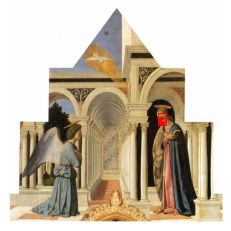

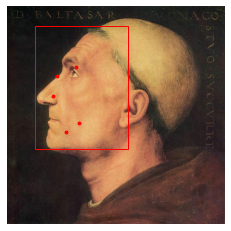

In [ ]:
# num es igual al numero de muestras que quiero q se ejecuten
# Este codigo es para graficar la deteccion de caras
# Graficaremos 20 imagenes
num = 1
for x in range(num):
  grafico = x
  boxlist = d[grafico]['box'].to_list()
  landmarklist = d[grafico]['landmark'].to_list()
  imagenlist = d[grafico]['imagen'].to_list()
  for i in range(10,50): 
    box = boxlist[i][0]
    landmark = landmarklist[i][0]
    fig, ax  = plt.subplots(figsize=(5, 4))
    ax.imshow(imagenlist[i])
    ax.scatter(landmark[:, 0], landmark[:, 1], s=8, c= 'red')
    rect = plt.Rectangle(
              xy     = (box[0], box[1]),
              width  = box[2] - box[0],
              height = box[3] - box[1],
              fill   = False,
              color  = 'red'
        )
    ax.add_patch(rect)
    ax.axis('off')

#Detentando mas de una Cara
-----------------------
En general podemos observar que el algoritmo logra detectar de buena forma rostros en las imagenes de 40 imagenes analizadas observamos que detecta de forma correcta 28, es decir un 70%.

Como primera aproximacion observamos que solo detecta un rostro por imagen. Seleccionaron dos imagenes con multiples rostros para analizar si el algoritmo es capaz de identificar mas de una cara en la misma imagen.

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:780: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"


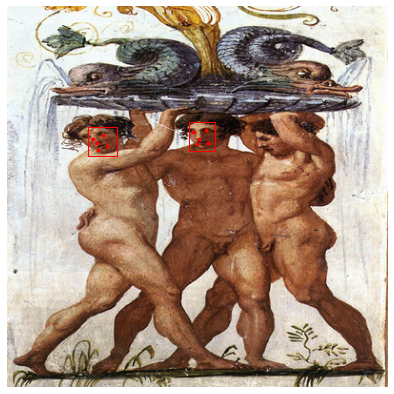

In [ ]:
# Imagenes Seleccionadas
# ==============================================================================
# Detección de bounding box y landmarks
# ==============================================================================
boxes, probs, landmarks = mtcnn.detect(imagenlist[10], landmarks=True)

# Representación con matplotlib
# ==============================================================================
fig, ax = plt.subplots(figsize=(12, 7))
ax.imshow(imagenlist[10])

for box, landmark in zip(boxes, landmarks):
    ax.scatter(landmark[:, 0], landmark[:, 1], s=8, c= 'red')
    rect = plt.Rectangle(
                xy     = (box[0], box[1]),
                width  = box[2] - box[0],
                height = box[3] - box[1],
                fill   = False,
                color  = 'red'
           )
    ax.add_patch(rect)
    
ax.axis('off');

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:780: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"


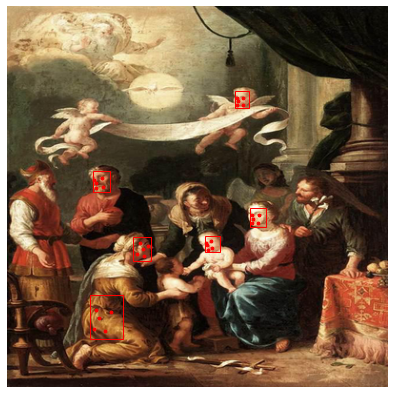

In [ ]:
# Imagenes Seleccionadas
# ==============================================================================
# Detección de bounding box y landmarks
# ==============================================================================
boxes, probs, landmarks = mtcnn.detect(imagenlist[11], landmarks=True)

# Representación con matplotlib
# ==============================================================================
fig, ax = plt.subplots(figsize=(12, 7))
ax.imshow(imagenlist[11])

for box, landmark in zip(boxes, landmarks):
    ax.scatter(landmark[:, 0], landmark[:, 1], s=8, c= 'red')
    rect = plt.Rectangle(
                xy     = (box[0], box[1]),
                width  = box[2] - box[0],
                height = box[3] - box[1],
                fill   = False,
                color  = 'red'
           )
    ax.add_patch(rect)
    
ax.axis('off');

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:780: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"


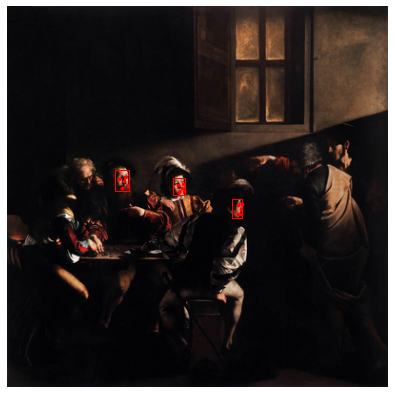

In [ ]:
# Imagenes Seleccionadas
# ==============================================================================
# Detección de bounding box y landmarks
# ==============================================================================
boxes, probs, landmarks = mtcnn.detect(imagenlist[18], landmarks=True)

# Representación con matplotlib
# ==============================================================================
fig, ax = plt.subplots(figsize=(12, 7))
ax.imshow(imagenlist[18])

for box, landmark in zip(boxes, landmarks):
    ax.scatter(landmark[:, 0], landmark[:, 1], s=8, c= 'red')
    rect = plt.Rectangle(
                xy     = (box[0], box[1]),
                width  = box[2] - box[0],
                height = box[3] - box[1],
                fill   = False,
                color  = 'red'
           )
    ax.add_patch(rect)
    
ax.axis('off');

Como se pudo observar el algoritmo es capaz de detectar multiples rostros en las imagenes. Ademas mejora su clasificacion cuando se da la opcion de detectar mas de un rostro.

#Extracción de caras
-----------------------

Para extraer directamente las partes de la imagen que contienen caras, se utiliza el método forward(). El objeto devuelto es un tensor con el valor de los pixeles del recorte (3 canales color x image_size x image_size). Si se detecta más de una cara (keep_all=True), entonces se devuelve un tensor de dimensiones (nº caras x 3 canales color x image_size x image_size).

In [ ]:
# Detección de cara
# Se extrae un rostro de las 20 primeras imagenes
# ==============================================================================
faces=[]
for i in range(len(imagenlist[:20])):
  face = mtcnn.forward(imagenlist[i])
  faces.append(face)

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:780: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"


La imagen devuelta por el detector es un tensor con dimensiones [3, 160, 160], es decir, los canales de color están en primera posición. Para poder mostrar la imagen con matplotlib, hay que pasarlos a la última posición [160, 160, 3] y convertir de objeto tensor a numpy array.

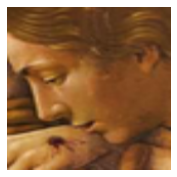

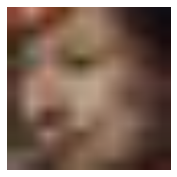

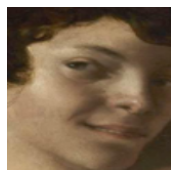

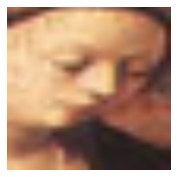

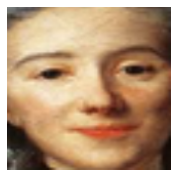

...

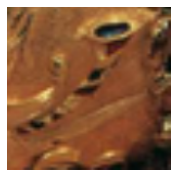

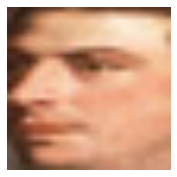

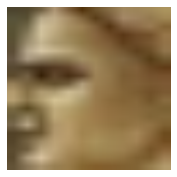

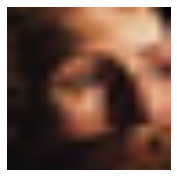

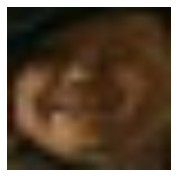

In [ ]:
#Graficar las Imagenes Rotadas 45
for i in range(len(faces)):
  fig, ax = plt.subplots(1, 1, figsize=(3, 3))
  face = faces[i].permute(1, 2, 0).int().numpy()
  ax.imshow(face)
  plt.axis('off');

In [ ]:
# Multiples Caras por imagen
# Detector MTCNN
# ==============================================================================
mtcnn = MTCNN(
            keep_all      = True,
            min_face_size = 20,
            thresholds    = [0.6, 0.7, 0.7],
            post_process  = False,
            image_size    = 160,
            device        = device
        )

# Detección de caras
# ==============================================================================
faces = mtcnn.forward(imagenlist[18])

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:780: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"


Al indicar keep_all=True, se devuelven todas las caras detectadas en la imagen. Las dimensiones del tensor generado son [nº caras, canales color, altura, anchura].


In [ ]:
faces.shape

torch.Size([14, 3, 160, 160])

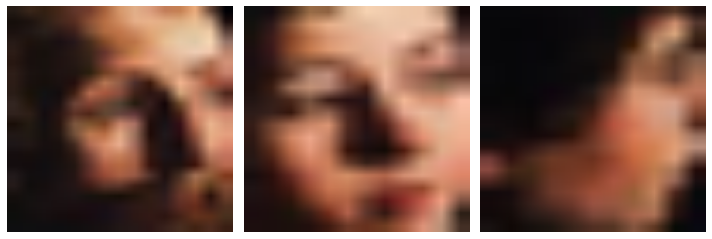

In [ ]:
# Representación con matplotlib
# ==============================================================================
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(10, 6))
axs= axs.flatten()

for i in range(faces.shape[0]):
    face = faces[i,:,:,:].permute(1, 2, 0).int().numpy()
    axs[i].imshow(face)
    axs[i].axis('off')
    
plt.tight_layout();


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:780: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"


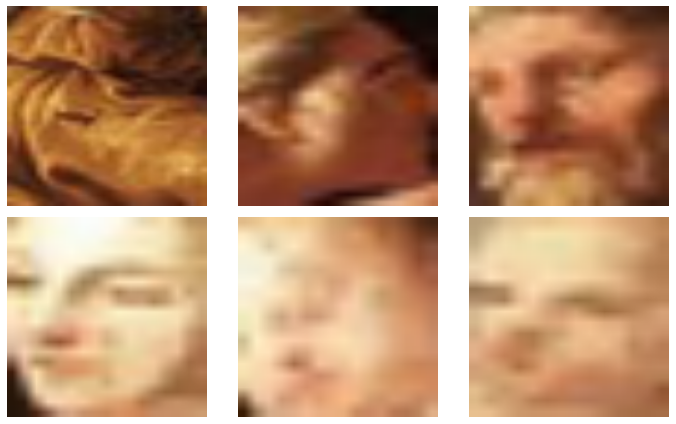

In [ ]:
# Multiples Caras por imagen
# Detector MTCNN
# ==============================================================================
mtcnn = MTCNN(
            keep_all      = True,
            min_face_size = 20,
            thresholds    = [0.6, 0.7, 0.7],
            post_process  = False,
            image_size    = 160,
            device        = device
        )

# Detección de caras
# ==============================================================================
faces = mtcnn.forward(imagenlist[11])
faces.shape
# Representación con matplotlib
# ==============================================================================
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(10, 6))
axs= axs.flatten()

for i in range(faces.shape[0]):
    face = faces[i,:,:,:].permute(1, 2, 0).int().numpy()
    axs[i].imshow(face)
    axs[i].axis('off')
    
plt.tight_layout();


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:780: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"


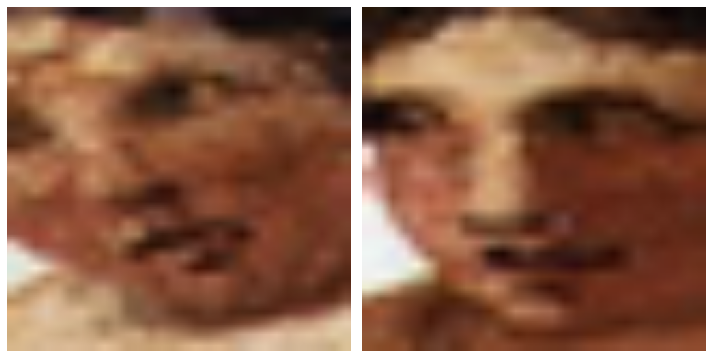

In [ ]:
# Multiples Caras por imagen
# Detector MTCNN
# ==============================================================================
mtcnn = MTCNN(
            keep_all      = True,
            min_face_size = 20,
            thresholds    = [0.6, 0.7, 0.7],
            post_process  = False,
            image_size    = 160,
            device        = device
        )

# Detección de caras
# ==============================================================================
faces = mtcnn.forward(imagenlist[10])
faces.shape
# Representación con matplotlib
# ==============================================================================
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 6))
axs= axs.flatten()

for i in range(faces.shape[0]):
    face = faces[i,:,:,:].permute(1, 2, 0).int().numpy()
    axs[i].imshow(face)
    axs[i].axis('off')
    
plt.tight_layout();

El proceso de extracción también puede hacerse utilizando las coordenadas de las bounding box. La diferencia respecto a extraerlas directamente con el detector MTCNN es que, este último, hace un redimensionamiento para que la imagen devuelta sea cuadrada.

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:780: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"


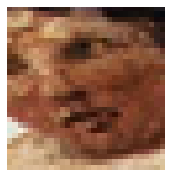

In [ ]:
# Extracción de cara a partir de una bounding box
# ==============================================================================
boxes, probs, landmarks = mtcnn.detect(imagenlist[10], landmarks=True)
x1, y1, x2, y2 = boxes[0].astype(int)
recorte_cara = np.array(imagenlist[10])[y1:y2, x1:x2]

fig, ax = plt.subplots(1, 1, figsize=(3, 3))
plt.imshow(recorte_cara)
plt.axis('off');

# Embedding de caras
-----------------------

Una vez identificadas las caras de la imagen, el siguiente paso consiste en obtener una transformación numérica que sea capaz de representar los aspectos característicos de cada una. Al vector numérico resultante se le conoce como embedding o encoding.

Los modelos de deep learning (redes convolucionales) que permiten obtener el embedding de caras no son sencillos de entrenar. Afortunadamente, existen varios modelos ya entrenados que son accesibles desde python. Dos de ellos son:

face_recognition_model_v1 de la librería dlib. Este modelo genera un embedding de 128 valores.

facenet_pytorch import InceptionResnetV1 de la librería facenet_pytorch. Este modelo genera un embedding de 512 valores.

In [ ]:
# Modelo para hacer el embedding de las caras
# ==============================================================================
from facenet_pytorch import InceptionResnetV1
encoder = InceptionResnetV1(pretrained='vggface2', classify=False, device=device).eval()

  0%|          | 0.00/107M [00:00<?, ?B/s]

In [ ]:
# Detección de cara
# ==============================================================================
cara = mtcnn(imagenlist[1])
# Embedding de cara
# ==============================================================================
embedding_cara = encoder.forward(cara.reshape((1,3, 160, 160))).detach().cpu()
embedding_cara

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:780: UserWarning: Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.
  warnings.warn("Note that order of the arguments: ceil_mode and return_indices will change"


tensor([[ 2.3369e-02, -3.2523e-02,  2.2838e-02,  4.5100e-02,  6.7647e-02,
         -4.0030e-02, -9.5980e-03, -3.1977e-03, -2.7970e-02, -1.1608e-02,
         -6.8736e-02,  8.4089e-03, -8.1862e-02, -1.5310e-03,  3.6279e-02,
         -2.5685e-02,  1.6766e-02,  1.3356e-02,  1.4050e-02,  5.3971e-02,
          1.8651e-02,  3.1817e-02, -4.6442e-02, -4.7167e-03,  1.9015e-02,
          2.7798e-03,  1.0826e-01,  3.3641e-02,  4.8234e-02, -7.8791e-02,
          4.6513e-03,  1.4010e-02,  3.6877e-02, -9.7567e-03,  4.4484e-02,
          1.1414e-02, -1.0885e-01,  1.4007e-02, -1.8083e-02,  5.2777e-02,
         -2.8036e-02,  2.0499e-02,  3.8767e-02, -1.3348e-01, -1.4733e-02,
         -2.6864e-02,  3.3095e-02, -2.0821e-03, -3.4304e-02,  5.1464e-02,
          1.1481e-01,  5.7344e-02,  8.9738e-02,  4.9586e-02, -2.5308e-02,
         -5.2982e-02,  1.6983e-02,  9.1861e-02, -2.1240e-02,  6.0161e-03,
         -1.7043e-02, -5.6309e-02,  6.4513e-02, -8.4520e-03, -1.8792e-02,
          2.8101e-02,  2.1042e-02, -1.

#Proximos Pasos
-----------------------
El objetivo de obtener una representación numérica de las caras (embeddings) es poder cuantificar similitudes entre ellas. En este caso se podrian comparar dos fotos e igentificar si se trata de la misma obra de arte o no. En esta parte de este proyecto no abordare este caso.

Los proximos pasos a seguir serian clasificar los rostros obtenidos y cruzarlos con la informacion de la obra. es decir, a traves de una camara poder leer la imagen y obtener el Titulo, nombre del autor y museo donde esta ubicada.